# The Influence of Socioeconomic Characteristics on the 2023 Polish Parliamentary Election Results

**Author**: Jakub Zapletal  
**Date**: 31.1.2025


## Introduction

## 1. Historical and Political Context of the 2023 Parliamentary Elections


In Poland’s parliamentary system, two major political forces have dominated since the beginning of the millennium: **Prawo i Sprawiedliwość (PiS)** and **Platforma Obywatelska (PO)**. The latest power shift between these two parties occurred following the parliamentary elections on October 15, 2023, after two electoral victories by Prawo i Sprawiedliwość.

Despite a number of policies perceived positively by the public—including PiS’s efforts in social welfare programs, infrastructure development, which were quite often a topic of discussion even in the Czechia and investments in national defense — the last eight years of PiS governance were widely regarded as highly authoritarian:|
> ### I. Judicial and Media Reforms  
> During its first term, PiS implemented a series of judicial and media reforms that significantly weakened democratic power balance in the country.  The government restructured public media, turning state-owned outlets into platforms that largely supported PiS’s political agenda, and introduced judicial reforms that gave the ruling party increased influence over the courts. These measures were widely criticized as a **form of state capture**, significantly **undermining the rule of law** and eroding the independence of the juridical system in Poland.    

> ### II. EU-Poland Relationship
> Tensions with European Union institutions were triggered by PiS's political direction. The erosion of democratic principles in Poland was denounced by numerous European leaders who claimed that the media and judicial reforms were against EU law. As a result of Poland's failure to comply with EU legal obligations, the European Commission filed a lawsuit against the nation and provisionally frozen portions of EU cash allocated for Poland.  


However, a major factor in the opposition's success in 2023 was the growing dissatisfaction with the authoritarian tendencies of the government and the current domestic and regional situation:

> ### I. Situation on the Belarusian-Polish border
> The poor handling of the situation on the Belarusian border, which resulted in a spike in migration into the Schengen area, was one of the main causes. Lukashenka started this migration crisis as part of a hybrid war against the European Union. One of the main points of controversy was the way in which migrant arrivals were handled and the inhumane treatment of refugees following their capture that followed on Polish territory. This situation was amplified by Agnieszka Holland's movie Zielona granica which depicted the harsh realities faced by migrants and further fueled public dissatisfaction with the PiS government's approach. This film, in particular, resonated with many voters, partly shifting support toward Lewica and partially to Platforma Obywatelska.

>### II. Domestic Situation and Restrictions on Civil Liberties  
>PiS played a significant role in deepening societal polarization by introducing yet another tightening of abortion laws, continuing a trend that had been unfolding since the 1990s. The new restrictions practically eliminated Polish women's access to legal abortion, it lead to cases where women indirectly died due to the lack of necessary medical intervention.  
It triggered widespread, led by the Strajk Kobiet movement, which mobilized hundreds of thousands of people across Poland. These protests, one of the largest in Poland’s recent history, became a powerful symbol of resistance against the government’s authoritarian tendencies and boosted the opposition's preferences.




## 2.  Political Parties in the 2023 Elections  

### Prawo i Sprawiedliwość, PiS 
- **Leader:** Jarosław Kaczyński (de facto), Mateusz Morawiecki (Leader in Campaing)  
- **Political Alignment:** Right-wing, national-conservative, populist  
- **Government Participation:** 2005–2007, 2015–2023 (ruling party)  
- **European Affiliation:** European Conservatives and Reformists (ECR)  

PiS has been the dominant force in Polish politics since winning the 2015 elections, implementing nationalist, conservative policies, judicial reforms, and social welfare programs. Despite its economic policies benefiting many Poles, its governance was marked by increasing authoritarian tendencies, which contributed to its declining support in 2023.  

### Koalicja Obywatelska, KO + IPL + Zieloni
- **Leader:** Donald Tusk  
- **Political Alignment:** Centre-right to centrist, liberal-conservative, pro-European  
- **Government Participation:** 2007–2015 (under Civic Platform, PO), 2023-
- **European Affiliation:** European People's Party (EPP)  

KO is the main opposition force, led by former European Council President Donald Tusk. It promotes democratic values, EU integration, and economic liberalism. After losing power to PiS in 2015, KO positioned itself as a defender of rule of law and human rights, ultimately regaining influence in 2023.  

### Lewica
- **Leaders:** Włodzimierz Czarzasty, Robert Biedroń, Magdalena Biejat
- **Political Alignment:** Left-wing, social democratic, progressive  
- **Government Participation:** None
- **European Affiliation:** Party of European Socialists (PES), European United Left–Nordic Green Left (GUE/NGL)  

Lewica represents Poland’s progressive forces, gender equality, and a secular state. It mainly gains in largest cities of Poland, particularly in response to PiS’s restrictions on abortion and LGBTQ+ rights.  

### Trzecia Droga 
- **Leaders:** Szymon Hołownia (Polska 2050), Władysław Kosiniak-Kamysz (PSL)  
- **Political Alignment:** Centrist, Christian-democratic, pro-European  
- **Government Participation:** Polish People's Party (PSL) was part of governments in 2007–2015  
- **European Affiliation:** PSL is part of the European People's Party (EPP)  

Third Way is a centrist coalition between Polska 2050 and the agrarian Polish People's Party (PSL). It appeals to moderate conservatives, rural voters, and those seeking a compromise between PiS and KO, but in the current government, it is the most conservative party,

### Confederation (Konfederacja Wolność i Niepodległość)
- **Leaders:** Krzysztof Bosak, Sławomir Mentzen  
- **Political Alignment:** Far-right, ultraconservative, libertarian-nationalist  
- **Government Participation:** None  
- **European Affiliation:** None (Eurosceptic, anti-EU stance)  

Confederation is a conservative, nationalist, and libertarian coalition known for its opposition to EU influence, immigration, and progressive social policies. It gained support among anti-establishment voters but remained a minor player in Sejm with 15 mandates.



In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
from matplotlib import colors
import os
import sys
import esda
from libpysal import graph
import numpy as np
from sklearn import ensemble, metrics, model_selection, svm


In [2]:
# set the workspace directory
os.chdir(r'C:\Computation\Scripts\Packages\sds-zapletalj-cze\99_assignment')

In [3]:
# load all spatial datasets
gdf_gminas = gpd.read_file(r'data\raw\geometries\level2_communes\poland.municipalities.json').to_crs(epsg=2180)
gdf_powiats = gpd.read_file(r'data\raw\geometries\level3_counties\poland.counties.json').to_crs(epsg=2180)
gdf_voivodeships = gpd.read_file(r'data\raw\geometries\level4_voivodeships\poland.voivodeships.json').to_crs(epsg=2180)


In [4]:
gdf_gminas['TERYT Gminy'] = gdf_gminas['terc'].str[:6]


In [5]:
gdf_gminas.head()

,terc,name,geometry,TERYT Gminy
0,2602042,Nagłowice,"POLYGON ((576305.296 305580.444, 575574.928 30...",260204
1,2602063,Sędziszów,"POLYGON ((567345.016 293508.922, 566292.93 293...",260206
2,2602012,Imielno,"POLYGON ((594997.721 298512.664, 594922.545 29...",260201
3,2604012,Bieliny,"POLYGON ((632924.594 330161.727, 634110.365 33...",260401
4,2604112,Mniów,"POLYGON ((605836.111 344534.448, 604544.897 34...",260411


Poland is administratively divided into 16 voivodeships (województwa), which represent the highest level of territorial governance. Voivodeships are further subdivided into counties (powiaty) and then into gminas, the smallest administrative units that include municipalities. Election results are most accurately recorded at the polling district level; however, there is no nationwide database of polling district boundaries —only addresses of individual election commissions are available.

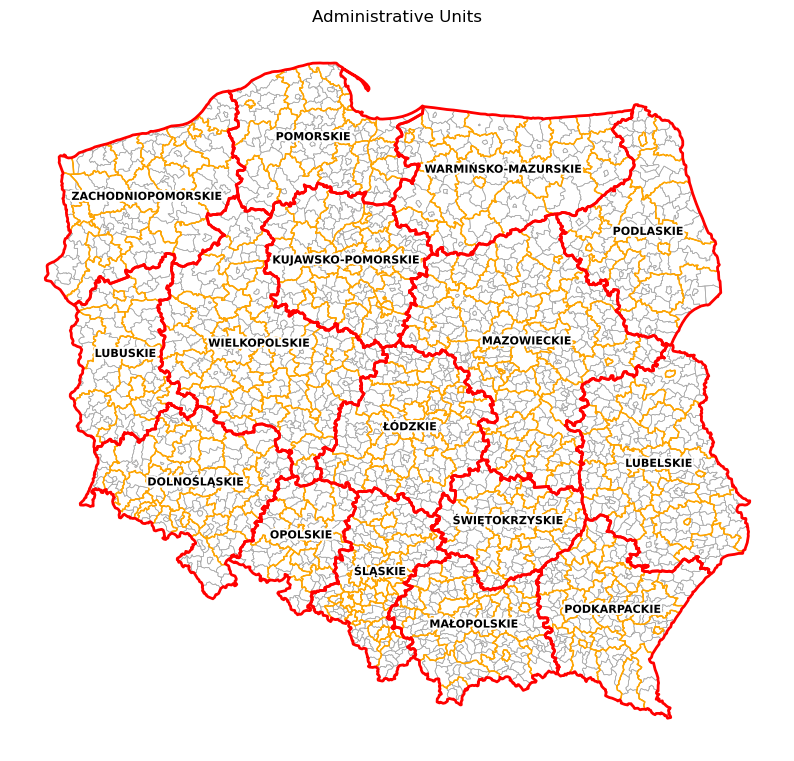

In [6]:
fig, ax = plt.subplots(figsize=(10, 10))

gdf_gminas.plot(ax=ax, facecolor='none', edgecolor='darkgrey', linewidth=0.5, label="Communes")
gdf_powiats.plot(ax=ax, facecolor='none', edgecolor='orange', linewidth=1, label="Counties")
gdf_voivodeships.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2, label="Voivodeships")

for x, y, label in zip(gdf_voivodeships.geometry.centroid.x, gdf_voivodeships.geometry.centroid.y, gdf_voivodeships['name']):
    text = ax.text(x, y, label, fontsize=8, ha='center', color='black', weight='bold')
    text.set_path_effects([path_effects.withStroke(linewidth=3, foreground="white")])

ax.set_title('Administrative Units')
ax.set_axis_off()
plt.show()

### Geometry Dataset Overview

| Administrative units     | Geometry type         | File                              |
|--------------------------|-----------------------|-----------------------------------|
| Communes                | Polygon               | level2_communes\gminy.shp         |
| Counties                | Polygon               | level3_counties\powiaty.shp      |
| Voivodeships            | Polygon               | level4_voivodeships\wojewodztwa.shp |


In [7]:
# load election results data as pandas dataframes
df_sejm_23_voivodeships = pd.read_excel(r'data\raw\sejm\level4_voivodeships\wyniki_gl_na_listy_po_wojewodztwach_proc_sejm_utf8.xlsx', )
df_sejm_23_powiats = pd.read_excel(r'data\raw\sejm\level3_counties\wyniki_gl_na_listy_po_powiatach_proc_sejm_utf8.xlsx')
df_sejm_23_gminas = pd.read_excel(r'data\raw\sejm\level2_communes\wyniki_gl_na_listy_po_gminach_proc_sejm_utf8.xlsx')



In [8]:
cols = ['KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ', 'KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI', 'KOMITET WYBORCZY NOWA LEWICA', 'KOALICYJNY KOMITET WYBORCZY TRZECIA DROGA POLSKA 2050 SZYMONA HOŁOWNI - POLSKIE STRONNICTWO LUDOWE', 'KOMITET WYBORCZY KONFEDERACJA WOLNOŚĆ I NIEPODLEGŁOŚĆ']
df_sejm_23_gminas[cols]=df_sejm_23_gminas[cols].replace(',','.',regex=True).astype(float)
df_sejm_23_powiats[cols]=df_sejm_23_powiats[cols].replace(',','.',regex=True).astype(float)


### Election Results Data Overview

| Administrative units     | File Path                                                                                   |
|--------------------------|---------------------------------------------------------------------------------------------|
| Communes                 | level2_communes/wyniki_gl_na_listy_po_gminach_proc_sejm_utf8.xlsx             |
| Counties                 | level3_counties/wyniki_gl_na_listy_po_powiatach_proc_sejm_utf8.xlsx           |
| Voivodeships             | level4_voivodeships/wyniki_gl_na_listy_po_wojewodztwach_proc_sejm_utf8.xlsx    |


In [9]:
# load socio-economic data as pandas dataframes
# communes/gminas level
df_net_migration_gminas = pd.read_csv(r'data\raw\se_data\level2_communes\Migration_Net_LUDN_1355_CTAB_20250206233240.csv', sep=';')
df_population_gminas = pd.read_csv(r'data\raw\se_data\level2_communes\Population_Urban_Rural_ALL_LUDN_1336_CTAB_20250202151831.csv', sep=';')
df_postworking_gminas = pd.read_csv(r'data\raw\se_data\level2_communes\Post_working_share_LUDN_2427_CTAB_20250202155119.csv', sep=';')
df_population_edu_level_gminas = pd.read_csv(r'data\raw\se_data\level2_communes\Edu_NARO_4315_CTAB_20250202213650.csv', sep=';')

# counties/powiats level
df_unemployment_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\Unemployment_rate_2392_CTAB_20250201200643.csv', sep=';', dtype={'code': str})
df_net_migration_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\Migration_Net_LUDN_1355_CTAB_20250206233454.csv', sep=';', dtype={'code': str})
df_population_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\Population_Urban_Rural_ALL_LLUDN_1336_CTAB_20250202211226.csv', sep=';', dtype={'code': str})
df_postworking_share = pd.read_csv(r'data\raw\se_data\level3_counties\Post_working_share_LUDN_2427_CTAB_20250202153741.csv', sep=';', dtype={'code': str})
df_crimes_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\Crimes_Property_Life_ORGA_2290_CTAB_20250202160349.csv', sep=';', dtype={'code': str})
df_suicides_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\SUICIDAL AND SUICIDAL BEHAVIOURS_ORGA_3833_CTAB_20250202160021.csv', sep=';', dtype={'code': str})
df_salaries_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\Wages_Salaries_2023_WYNA_2497_CTAB_20250202142125.csv', sep=';', dtype={'code': str})
df_population_edu_level_powiats = pd.read_csv(r'data\raw\se_data\level3_counties\Edu_NARO_4315_CTAB_20250202213908.csv', sep=';', dtype={'code': str})


In [10]:
df_suicides_powiats.rename(columns={'total;total;2021;[person]': 'total;total;2021;[person]_suicide'}, inplace=True)

### Socio-economic Data Overview

| Administrative units     | Description                                     | File Path                                                                                         | Year |
|--------------------------|-------------------------------------------------|---------------------------------------------------------------------------------------------------|------|
| Communes (Gminas)        | Gmina migration: Net migration per 1000 population                    | level2_communes\Migration_Net_LUDN_1355_CTAB_20250206233240.csv                             | 2023 |
| Communes (Gminas)        | Total population and urban/rural distribution for gminas       | level2_communes/Population_Urban_Rural_ALL_LUDN_1336_CTAB_20250202151831.csv                      | 2024 |
| Communes (Gminas)        | Education level distribution among population over 13 years old in gminas         | level2_communes/Edu_NARO_4315_CTAB_20250202213650.csv                                            | 2023 |
| Communes (Gminas)        | Share of population in post-working age for gminas              | level2_communes/Post_working_share_LUDN_2427_CTAB_20250202155119.csv                              | 2023 |
| Counties (Powiaty)       | Unemployment rate for gminas                  | level3_counties/Unemployment_rate_2392_CTAB_20250201200643.csv                                    | 2024 |
| Counties (Powiaty)       | Powiats migration: Net migration per 1000 population                    | level3_counties/Migration_out_LUDN_1350_CTAB_20250202152758.csv                                  | 2021 |
| Counties (Powiaty)       | Total population and urban/rural distribution for powiats       | level3_counties\Migration_Net_LUDN_1355_CTAB_20250206233454.csv                     | 2023 |
| Counties (Powiaty)       | Share of population in post-working age for powiats              | level3_counties/Post_working_share_LUDN_2427_CTAB_20250202153741.csv                              | 2023 |
| Counties (Powiaty)       | Crime statistics on property and life for powiats  | level3_counties/Crimes_Property_Life_ORGA_2290_CTAB_20250202160349.csv                            | 2024 |
| Counties (Powiaty)       | Suicide and suicidal behaviors for powiats | level3_counties/SUICIDAL AND SUICIDAL BEHAVIOURS_ORGA_3833_CTAB_20250202160021.csv               | 2024 |
| Counties (Powiaty)       | Wage and salary data for powiats             | level3_counties/Wages_Salaries_2023_WYNA_2497_CTAB_20250202142125.csv                             | 2024 |
| Counties (Powiaty)       | Education level distribution among population over 13 years old in powiats         | level3_counties/Edu_NARO_4315_CTAB_20250202213908.csv                                            | 2023 |


### Socioeconomic Data Processing

Data Preparation and ID Adjustment
Unique identities (IDs) must be standardized in order to join socioeconomic data with geometrical data. This involved:

- Setting the "Code" column to string
- Filtering rows on form of IDs (Voivodeships from Powiats etc.)
- Removal of empty columns
- Standardization of IDs.


All the data comes from different providers but was processed by Statistics Poland: [Statistics Poland Database](https://stat.gov.pl/en/).

In [11]:
df_unemployment_powiats.head()


,Code,Name,total;2023;[%],Unnamed: 3
0,0,POLAND,5.1,NaN
1,200000,DOLNOŚLĄSKIE,4.4,NaN
2,201000,Powiat bolesławiecki,2.8,NaN
3,202000,Powiat dzierżoniowski,5.6,NaN
4,203000,Powiat głogowski,6.5,NaN


In [12]:
# Socioeconomic data

# adjusting IDs to ensure all data can be joined to geometries

# GMINAS
# se data - gminas
dfs_se_gminas = [df_net_migration_gminas, df_population_gminas, df_postworking_gminas, df_population_edu_level_gminas]
for idx, df in enumerate(dfs_se_gminas):
    df["Code"] = df["Code"].astype(str)
    df.loc[:, "Code"] = df["Code"].str.zfill(7)  
    df = df[df["Code"].str[-3:] != "000"]  
    df = df.drop(columns=["Name"], errors="ignore")
    dfs_se_gminas[idx] = df  
df_net_migration_gminas, df_population_gminas, df_postworking_gminas, df_population_edu_level_gminas = dfs_se_gminas


# POWIATS
# se data - powiats
# get dtype of the code column
dfs_se_powiats = [df_unemployment_powiats, df_net_migration_powiats, df_population_powiats, df_postworking_share, df_crimes_powiats, df_suicides_powiats, df_salaries_powiats, df_population_edu_level_powiats]
for idx, df in enumerate(dfs_se_powiats):
    df["Code"] = df["Code"].astype(str)
    df.loc[:, "Code"] = df["Code"].str.zfill(7)
    df = df[df["Code"].str[-3:] == "000"]  
    df = df.drop(columns=["Name"], errors="ignore")
    df.loc[:, "Code"] = df["Code"].str[:4]
    dfs_se_powiats[idx] = df  
df_unemployment_powiats, df_net_migration_powiats, df_population_powiats, df_postworking_share, df_crimes_powiats, df_suicides_powiats, df_salaries_powiats, df_population_edu_level_powiats = dfs_se_powiats



In [13]:
df_gminas_soc = dfs_se_gminas[0]
# Iterate over the remaining DataFrames and merge them on 'Code'
for df in dfs_se_gminas[1:]:
    df_gminas_soc = pd.merge(df_gminas_soc, df, on="Code", how="outer")
df_gminas_soc = df_gminas_soc.loc[:, ~df_gminas_soc.columns.str.startswith('Unnamed')]


In [15]:
df_powiats_soc = dfs_se_powiats[0]
for df in dfs_se_powiats[1:]:
    df_powiats_soc = pd.merge(df_powiats_soc, df, on="Code", how="outer")
    df_powiats_soc = df_powiats_soc.loc[:, ~df_powiats_soc.columns.str.startswith('Unnamed')]

### Polls Data Processing

**ID Standardization for Spatial Join**  
To ensure compatibility with geometries, **TERYT** administrative codes are cleaned and standardized by:  
- Removing records with missing IDs.  
- Converting IDs to string format.  
- Formatting **TERYT Gminy** as six-digit codes.  


Data comes from: [Sejm and Senate Elections 2023](https://sejmsenat2023.pkw.gov.pl/sejmsenat2023/)


In [16]:
# Polls data
# adjusting IDs to ensure all data can be joined to geometries
# polls data - gminas
df_sejm_23_gminas = df_sejm_23_gminas.dropna(subset=["TERYT Gminy"]).reset_index(drop=True)
df_sejm_23_gminas["TERYT Gminy"] = df_sejm_23_gminas["TERYT Gminy"].dropna().astype(int).astype(str)
df_sejm_23_gminas["TERYT Gminy"] = df_sejm_23_gminas["TERYT Gminy"].apply(lambda x: x.zfill(6) if len(x) == 5 else x)


df_sejm_23_powiats = df_sejm_23_powiats.dropna(subset=["TERYT Powiatu"]).reset_index(drop=True)
df_sejm_23_powiats["TERYT Powiatu"] = df_sejm_23_powiats["TERYT Powiatu"].dropna().astype(int).astype(str)
df_sejm_23_powiats["TERYT Powiatu"] = df_sejm_23_powiats["TERYT Powiatu"].apply(lambda x: x.zfill(6) if len(x) == 5 else x)
df_sejm_23_powiats["TERYT Powiatu"] = df_sejm_23_powiats["TERYT Powiatu"].str[:4]

### Join all Datasets per Administrative Level  

In the next step, election results and socioeconomic factors will be assigned to each area based on the identical IDs prepared in the previous step.


In [17]:
# JOIN SOCIO-ECONOMIC DATA WITH GEOMETRIES FOR GMINAS
gdf_gminas_soc = gdf_gminas.merge(df_gminas_soc, left_on='terc', right_on='Code', how='left')
count_joined = gdf_gminas_soc[gdf_gminas_soc['Code'].notnull()].shape[0]
print(f"Succesfully joined {count_joined} out of {len(gdf_gminas_soc.index)} gminas")


Succesfully joined 2463 out of 2477 gminas


In some gminas, no attributes were joined. Let's find out why.

In [18]:
gdf_gminas_empty = gdf_gminas_soc[gdf_gminas_soc['Code'].isnull()]
gdf_gminas_empty.explore()

In [19]:
# Let's fix it, found a pattern in missing data, replacing last digit in code with 3
reg_replace = ['3001022', '1420112', '1420042', '1438052', '1004062', '3007052', '1018042', '0608052', '1409062', '0602062', '2609032', '2602092', '0224032', '1813022']
gdf_gminas.loc[gdf_gminas['terc'].isin(reg_replace), 'terc'] = gdf_gminas['terc'].apply(lambda x: x[:-1] + '3')

It seems that some `terc` codes are not correctly assigned in the geometry dataset.

In [20]:
# JOIN SOCIO-ECONOMIC DATA WITH GEOMETRIES FOR GMINAS
gdf_gminas_soc = gdf_gminas.merge(df_gminas_soc, left_on='terc', right_on='Code', how='left')
count_joined = gdf_gminas_soc[gdf_gminas_soc['Code'].notnull()].shape[0]
print(f"Succesfully joined {count_joined} out of {len(gdf_gminas_soc.index)} gminas")


Succesfully joined 2477 out of 2477 gminas


In [21]:
# JOIN POLLS DATA WITH GEOMETRIES FOR GMINAS
gdf_gminas_soc_sejm = gdf_gminas_soc.merge(df_sejm_23_gminas, left_on='TERYT Gminy', right_on='TERYT Gminy', how='left')
count_joined = gdf_gminas_soc_sejm[gdf_gminas_soc_sejm['Nr okręgu'].notnull()].shape[0]
print(f"Succesfully joined {count_joined} out of {len(gdf_gminas_soc_sejm.index)} gminas")


Succesfully joined 2476 out of 2477 gminas


In one gmina, no polls results were joined and it's city of Warszaw.
In the results by gminas, Warsaw is divided into multiple city districts. To simplify the process, we will use the powiat Warsaw.

In [22]:
gdf_gminas_soc_sejm_empty = gdf_gminas_soc_sejm[gdf_gminas_soc_sejm['Nr okręgu'].isnull()]
gdf_gminas_soc_sejm_empty.explore()


In [23]:
warsaw_results = df_sejm_23_powiats[df_sejm_23_powiats['TERYT Powiatu'] == '1465'].copy()
warsaw_results.iloc[0, warsaw_results.columns.get_loc('TERYT Powiatu')] = '146501'
warsaw_results = warsaw_results.rename(columns={'TERYT Powiatu': 'TERYT Gminy'})
df_sejm_23_gminas = pd.concat([df_sejm_23_gminas, warsaw_results], ignore_index=True)

In [24]:
# JOIN POLLS DATA WITH GEOMETRIES FOR GMINAS
gdf_gminas_soc_sejm = gdf_gminas_soc.merge(df_sejm_23_gminas, left_on='TERYT Gminy', right_on='TERYT Gminy', how='left')
count_joined = gdf_gminas_soc_sejm[gdf_gminas_soc_sejm['Nr okręgu'].notnull()].shape[0]
print(f"Succesfully joined {count_joined} out of {len(gdf_gminas_soc_sejm.index)} gminas")


Succesfully joined 2477 out of 2477 gminas


In [25]:
# JOIN SOCIO-ECONOMIC DATA WITH GEOMETRIES FOR POWIATS
gdf_powiats_soc = gdf_powiats.merge(df_powiats_soc, left_on='terc', right_on='Code', how='left')
count_joined = gdf_powiats_soc[gdf_powiats_soc['Code'].notnull()].shape[0]
print(f"Succesfully joined {count_joined} out of {len(gdf_powiats_soc.index)} powiats")


Succesfully joined 380 out of 380 powiats


In [26]:
gdf_powiaty_soc_sejm = gdf_powiats_soc.merge(df_sejm_23_powiats, left_on='terc', right_on='TERYT Powiatu', how='left')
count_joined = gdf_powiaty_soc_sejm[gdf_powiaty_soc_sejm['Nr okręgu'].notnull()].shape[0]
print(f"Succesfully joined {count_joined} out of {len(gdf_powiaty_soc_sejm.index)} powiats")


Succesfully joined 380 out of 380 powiats


### Recalculate Some Attributes to be More Representative

The goal is to recalculate certain attributes so that they become comparable across different regions and datasets.


In [27]:

# Proportion of people living in urban areas
gdf_gminas_soc_sejm["SHARE_URBAN_areas"] = (
    gdf_gminas_soc_sejm["in urban areas;place of residence;as of 30 June;total;2024;[person]"] /
    gdf_gminas_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Proportion of people living in rural areas
gdf_gminas_soc_sejm["SHARE_RURAL_areas"] = (
    gdf_gminas_soc_sejm["in rural areas;place of residence;as of 30 June;total;2024;[person]"] /
    gdf_gminas_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Proportion of people with lower education levels
gdf_gminas_soc_sejm["SHARE_EDU_LEVEL_1"] = (
    (gdf_gminas_soc_sejm["total;lower secondary;2021;[person]"] +
     gdf_gminas_soc_sejm["total;primary completed;2021;[person]"]) /
    gdf_gminas_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# proportion of people with tertiary education
gdf_gminas_soc_sejm["SHARE_EDU_LEVEL_3"] = (
    gdf_gminas_soc_sejm["total;tertiary;2021;[person]"] /
    gdf_gminas_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)
gdf_gminas_soc_sejm = gdf_gminas_soc_sejm[['terc', 'geometry', 'SHARE_URBAN_areas',
                                            'SHARE_RURAL_areas', 'SHARE_EDU_LEVEL_1', 'SHARE_EDU_LEVEL_3',
                                            'at post-working age;2023;[%]', 'KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ', 
                                            'KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI', 'KOMITET WYBORCZY KONFEDERACJA WOLNOŚĆ I NIEPODLEGŁOŚĆ',
                                              'KOMITET WYBORCZY NOWA LEWICA', 'KOALICYJNY KOMITET WYBORCZY TRZECIA DROGA POLSKA 2050 SZYMONA HOŁOWNI - POLSKIE STRONNICTWO LUDOWE']]


In [28]:
# Calculate SHARE_URBAN_areas
gdf_powiaty_soc_sejm["SHARE_URBAN_areas"] = (
    gdf_powiaty_soc_sejm["in urban areas;place of residence;as of 30 June;total;2024;[person]"] /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Calculate SHARE_RURAL_areas
gdf_powiaty_soc_sejm["SHARE_RURAL_areas"] = (
    gdf_powiaty_soc_sejm["in rural areas;place of residence;as of 30 June;total;2024;[person]"] /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Calculate SHARE_EDU_LEVEL_1
gdf_powiaty_soc_sejm["SHARE_EDU_LEVEL_1"] = (
    (gdf_powiaty_soc_sejm["total;lower secondary;2021;[person]"] +
     gdf_powiaty_soc_sejm["total;primary completed;2021;[person]"]) /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Calculate SHARE_EDU_LEVEL_3
gdf_powiaty_soc_sejm["SHARE_EDU_LEVEL_3"] = (
    gdf_powiaty_soc_sejm["total;tertiary;2021;[person]"] /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Calculate SUICIDE_RATE
gdf_powiaty_soc_sejm["SUICIDE_RATE"] = (
    (gdf_powiaty_soc_sejm["total;total;2018;[person]"] +
     gdf_powiaty_soc_sejm["total;total;2019;[person]"] +
     gdf_powiaty_soc_sejm["total;total;2020;[person]"] +
     gdf_powiaty_soc_sejm["total;total;2021;[person]_suicide"] +
     gdf_powiaty_soc_sejm["total;total;2022;[person]"]) /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Calculate CRIME_RATE_LIFE
gdf_powiaty_soc_sejm["CRIME_RATE_LIFE"] = (
    (gdf_powiaty_soc_sejm["against life and health;2020;[-]"] +
     gdf_powiaty_soc_sejm["against life and health;2021;[-]"] +
     gdf_powiaty_soc_sejm["against life and health;2022;[-]"] +
     gdf_powiaty_soc_sejm["against life and health;2023;[-]"]) /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

# Calculate CRIME_RATE_PROPERTY
gdf_powiaty_soc_sejm["CRIME_RATE_PROPERTY"] = (
    (gdf_powiaty_soc_sejm["against property;2020;[-]"] +
     gdf_powiaty_soc_sejm["against property;2021;[-]"] +
     gdf_powiaty_soc_sejm["against property;2022;[-]"] +
     gdf_powiaty_soc_sejm["against property;2023;[-]"]) /
    gdf_powiaty_soc_sejm["total;place of residence;as of 30 June;total;2024;[person]"]
)

gdf_powiaty_soc_sejm = gdf_powiaty_soc_sejm[['terc', 'geometry', 'SHARE_URBAN_areas',
                                              'SHARE_RURAL_areas', 'SHARE_EDU_LEVEL_1', 'SHARE_EDU_LEVEL_3',
                                                'SUICIDE_RATE', 'CRIME_RATE_LIFE', 'CRIME_RATE_PROPERTY',
                                                  'net migration per 1000 population;total;2023;[person]',
                                                    'grand total;2023;[PLN]', 'at post-working age;2023;[%]', 'KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ',
                                                     'KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI',
                                                    'KOMITET WYBORCZY KONFEDERACJA WOLNOŚĆ I NIEPODLEGŁOŚĆ', 
                                                     'KOMITET WYBORCZY NOWA LEWICA']]



#### Join attributes from powiats to gminas level

In [29]:
cols_subset = [
    'SUICIDE_RATE', 
    'CRIME_RATE_LIFE', 
    'CRIME_RATE_PROPERTY', 
    'net migration per 1000 population;total;2023;[person]', 
    'grand total;2023;[PLN]', 
    'geometry'
]

# Perform spatial join using the 'predicate' argument for the newer versions of geopandas
gdf_gminas_soc_sejm_joined = gdf_gminas_soc_sejm.sjoin(
    gdf_powiaty_soc_sejm[cols_subset], 
    how="left", 
    predicate='within'  
)




### Electoral Map Visual Interpretation

The electoral map's visual interpretation makes it evident that **Prawo i Sprawiedliwość** enjoys substantial support throughout the country's east, particularly outside of local centers. In **Silesia**, and especially in **Lesser Poland**, it enjoys widespread support. On the other hand, big cities and the western part of the country are more likely to support **Civic Platform** and perhaps other parties.


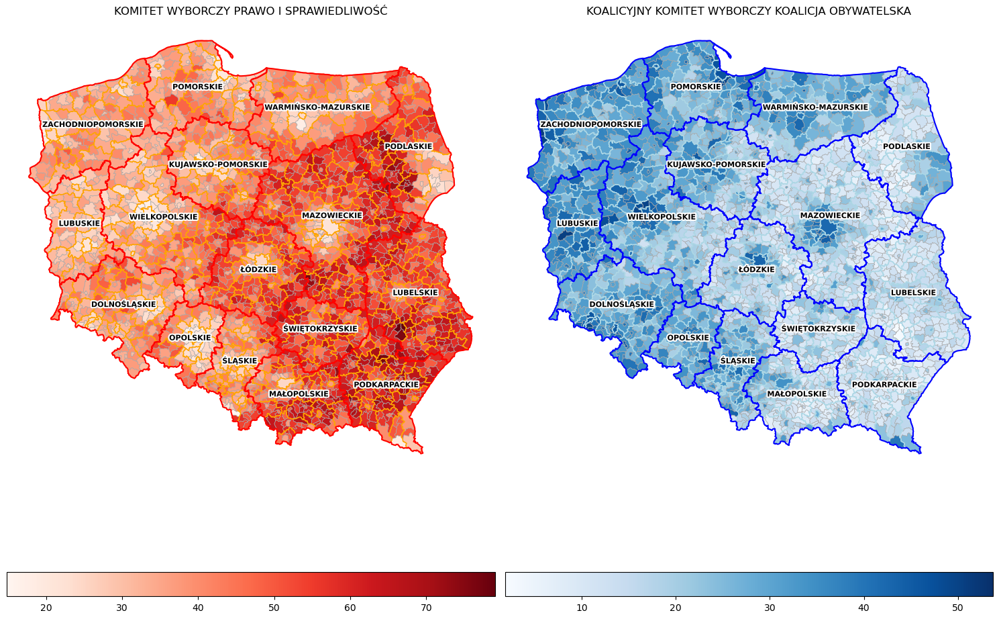

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
norm_atb = colors.Normalize(vmin=gdf_gminas_soc_sejm_joined['KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ'].min(),
                            vmax=gdf_gminas_soc_sejm_joined['KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ'].max())

norm_bbt = colors.Normalize(vmin=gdf_gminas_soc_sejm_joined['KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI'].min(),
                            vmax=gdf_gminas_soc_sejm_joined['KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI'].max())


gdf_gminas_soc_sejm_joined.plot(ax=axes[0], column='KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ', cmap='Reds', 
                                linewidth=0.5, edgecolor='darkgrey', legend=True,
                                legend_kwds={'orientation': "horizontal"}, 
                                norm=norm_atb)
axes[0].set_title('KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ')
axes[0].set_axis_off()
gdf_gminas_soc_sejm_joined.plot(ax=axes[1], column='KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI', cmap='Blues', 
                                linewidth=0.5, edgecolor='darkgrey', legend=True, 
                                legend_kwds={'orientation': "horizontal"},
                                norm=norm_bbt)
gdf_powiats.plot(ax=axes[0], facecolor='none', edgecolor='orange', linewidth=1, label="Counties")
gdf_voivodeships.plot(ax=axes[0], facecolor='none', edgecolor='red', linewidth=1.5, label="Voivodeships")
gdf_powiats.plot(ax=axes[1], facecolor='none', edgecolor='lightblue', linewidth=1, label="Counties")
gdf_voivodeships.plot(ax=axes[1], facecolor='none', edgecolor='blue', linewidth=1.5, label="Voivodeships")
for x, y, label in zip(gdf_voivodeships.geometry.centroid.x, gdf_voivodeships.geometry.centroid.y, gdf_voivodeships['name']):
    text = axes[0].text(x, y, label, fontsize=8, ha='center', color='black', weight='bold')
    text.set_path_effects([path_effects.withStroke(linewidth=3, foreground="white")])
for x, y, label in zip(gdf_voivodeships.geometry.centroid.x, gdf_voivodeships.geometry.centroid.y, gdf_voivodeships['name']):
    text = axes[1].text(x, y, label, fontsize=8, ha='center', color='black', weight='bold')
    text.set_path_effects([path_effects.withStroke(linewidth=3, foreground="white")])
    
axes[1].set_title('KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA')
axes[1].set_axis_off()
plt.tight_layout()
plt.show()


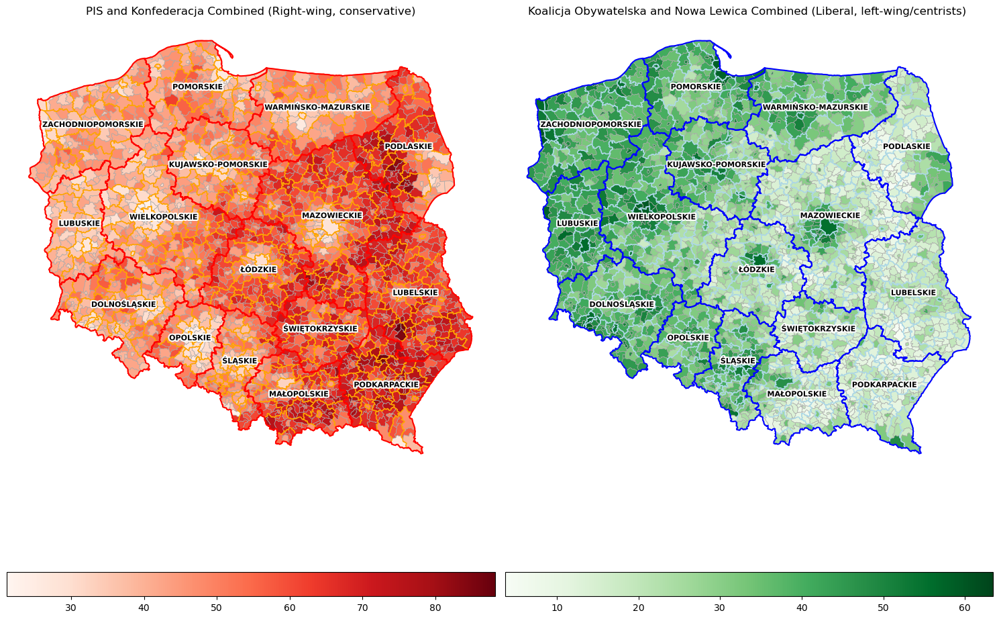

In [31]:
gdf_gminas_soc_sejm_joined['CONSERVATIVE'] = (gdf_gminas_soc_sejm_joined['KOMITET WYBORCZY PRAWO I SPRAWIEDLIWOŚĆ'] + 
                                                      gdf_gminas_soc_sejm_joined['KOMITET WYBORCZY KONFEDERACJA WOLNOŚĆ I NIEPODLEGŁOŚĆ'])
gdf_gminas_soc_sejm_joined['LIBERAL'] = (gdf_gminas_soc_sejm_joined['KOALICYJNY KOMITET WYBORCZY KOALICJA OBYWATELSKA PO .N IPL ZIELONI'] + 
                                                                      gdf_gminas_soc_sejm_joined['KOMITET WYBORCZY NOWA LEWICA'])
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
norm_atb = colors.Normalize(vmin=gdf_gminas_soc_sejm_joined['CONSERVATIVE'].min(),
                            vmax=gdf_gminas_soc_sejm_joined['CONSERVATIVE'].max())
norm_bbt = colors.Normalize(vmin=gdf_gminas_soc_sejm_joined['LIBERAL'].min(),
                            vmax=gdf_gminas_soc_sejm_joined['LIBERAL'].max())
gdf_gminas_soc_sejm_joined.plot(ax=axes[0], column='CONSERVATIVE', cmap='Reds', 
                                linewidth=0.5, edgecolor='darkgrey', legend=True,
                                legend_kwds={'orientation': "horizontal"}, 
                                norm=norm_atb)
axes[0].set_title('PIS and Konfederacja Combined (Right-wing, conservative)')
axes[0].set_axis_off()
gdf_gminas_soc_sejm_joined.plot(ax=axes[1], column='LIBERAL', cmap='Greens', 
                                linewidth=0.5, edgecolor='darkgrey', legend=True, 
                                legend_kwds={'orientation': "horizontal"},
                                norm=norm_bbt)

gdf_powiats.plot(ax=axes[0], facecolor='none', edgecolor='orange', linewidth=1, label="Counties")
gdf_voivodeships.plot(ax=axes[0], facecolor='none', edgecolor='red', linewidth=1.5, label="Voivodeships")
gdf_powiats.plot(ax=axes[1], facecolor='none', edgecolor='lightblue', linewidth=1, label="Counties")
gdf_voivodeships.plot(ax=axes[1], facecolor='none', edgecolor='blue', linewidth=1.5, label="Voivodeships")
for x, y, label in zip(gdf_voivodeships.geometry.centroid.x, gdf_voivodeships.geometry.centroid.y, gdf_voivodeships['name']):
    text = axes[0].text(x, y, label, fontsize=8, ha='center', color='black', weight='bold')
    text.set_path_effects([path_effects.withStroke(linewidth=3, foreground="white")])

for x, y, label in zip(gdf_voivodeships.geometry.centroid.x, gdf_voivodeships.geometry.centroid.y, gdf_voivodeships['name']):
    text = axes[1].text(x, y, label, fontsize=8, ha='center', color='black', weight='bold')
    text.set_path_effects([path_effects.withStroke(linewidth=3, foreground="white")])

axes[1].set_title('Koalicja Obywatelska and Nowa Lewica Combined (Liberal, left-wing/centrists) ')
axes[1].set_axis_off()
plt.tight_layout()
plt.show()


### Spatial Trend in Liberal/Conservative Parties Support

The support for conservative and liberal parties follows a spatial pattern that is typically not very different among regions, as may be seen in the visual interpretation. For instance, support for liberal parties is not limited to areas of high support inside these regions; rather, it stretches well beyond the limits. Another interesting finding is the relatively low support for conservative right-wing parties near the Belarusian border.

In [32]:
contiguity = graph.Graph.build_contiguity(gdf_gminas_soc_sejm_joined, rook=False)
moran = esda.Moran(gdf_gminas_soc_sejm_joined["CONSERVATIVE"], contiguity)
lisa = esda.Moran_Local(gdf_gminas_soc_sejm_joined['CONSERVATIVE'], contiguity)
m = lisa.explore(
    gdf = gdf_gminas_soc_sejm_joined,
    tiles='CartoDB Positron')
lisa.explore(gdf_gminas_soc_sejm_joined, m = m, crit_value=0.05, alpha=0.01)

In [33]:
gdf_gminas_soc_sejm_joined['Moran_I'] = moran.I 
gdf_gminas_soc_sejm_joined['Local_Moran_I'] = lisa.Is 

def classify_moran(local_moran, gdf, alpha=0.05):
    avg = gdf['CONSERVATIVE'].mean()
    std = gdf['CONSERVATIVE'].std()
    is_significant = local_moran > alpha
    conditions = [
        (is_significant) & (local_moran > 0) & (gdf['CONSERVATIVE'] > avg),
        (is_significant) & (local_moran > 0) & (gdf['CONSERVATIVE'] < avg),
        (is_significant) & (local_moran < 0) & (gdf['CONSERVATIVE'] > avg),
        (is_significant) & (local_moran < 0) & (gdf['CONSERVATIVE'] < avg)
    ]
    categories = ['High-High', 'Low-Low', 'High-Low', 'Low-High']
    gdf['Moran_Classification'] = np.select(conditions, categories, default='Undefined')

classify_moran(lisa.Is, gdf_gminas_soc_sejm_joined)



### Influence of Cities with High Support on Surrounding Areas

Let's find out whether a city with a notably high level of support for conservative/liberal can have an impact on the neighborhoods around it. We will utilize a 5-kilometer buffer zone surrounding cities with a population of 100,000 or more.

In [34]:
df_cities = pd.read_csv(r'data/raw/geometries/cities.csv')
# create geodatframe from cities data, set crs to EPSG:2180
gdf_cities = gpd.GeoDataFrame(df_cities, geometry=gpd.points_from_xy(df_cities['lng'], df_cities['lat'])).set_crs('EPSG:4326')
gdf_cities = gdf_cities.to_crs(epsg=2180)
gdf_cities = gdf_cities[gdf_cities['population'] > 100000]

gdf_cities['Moran_Classification'] = gdf_cities.apply(lambda x: gdf_gminas_soc_sejm_joined.loc[gdf_gminas_soc_sejm_joined.contains(x.geometry)].iloc[0]['Moran_Classification'], axis=1)
gdf_cities['Moran_Classification'].value_counts()


Moran_Classification
Low-Low      33
Undefined     4
Name: count, dtype: int64

### Conservative Right-Wing Parties Have Low Support in Big Cities  

It's interesting to note that 34 of the 37 major cities (those with populations over 100,000) are classified as having low levels of support for conservative right-wing parties both within the city and in the surrounding (based on contiguity).

In [35]:
buffer = 10000
gdf_cities = gdf_cities[gdf_cities['Moran_Classification'] == 'Low-Low'].copy()
gdf_cities['geometry'] = gdf_cities['geometry'].buffer(10000)

gdf_gminas_soc_sejm_joined['low_support_conservative'] = 0

for idx, city in gdf_cities.iterrows():
    buffer_intersects = gdf_gminas_soc_sejm_joined.intersects(city.geometry)
    gdf_gminas_soc_sejm_joined.loc[buffer_intersects, 'low_support_conservative'] = 1
    city_intersects = gdf_gminas_soc_sejm_joined.intersects(city.geometry.buffer(-buffer))
    gdf_gminas_soc_sejm_joined.loc[city_intersects, 'low_support_conservative'] = 0
gdf_gminas_soc_sejm_joined['low_support_conservative'].value_counts()

low_support_conservative
0    2261
1     216
Name: count, dtype: int64

### What explains the strong support for conservative parties in Poland?
The goal of the final section will be to identify the combination of attributes that best describes voting preferences in Poland. As the dependent variable will be used the sum of conservative votes (for PiS and Konfederacja Wolność i Niepodległość).

Since the percentage of the population in urban and rural areas complement each to other, we will use only single variable.


#### Attributes for the First Model

The following attributes will be used for the first model:

- SHARE_URBAN_areas: Percentage of the population in urban areas
- SHARE_EDU_LEVEL_3: Percentage of the population with completed higher education
- SHARE_EDU_LEVEL_1: Percentage of the population with completed basic and vocational education
- at post-working age;2023;[%]: Percentage of the population at post-working age
- CRIME_RATE_LIFE: Total number of crimes against health or life per capita from 2018-2023
- CRIME_RATE_PROPERTY: Total number of crimes against property per capita from 2018-2023
- grand total;2023;[PLN]: Average salary in 2023
- low_support_conservative: Level of support for conservative parties

---
#### Attributes for Model 2

The following attributes will be used for the second model:

- SHARE_RURAL_areas: Percentage of the population in rural areas
- SHARE_EDU_LEVEL_1: Percentage of the population with completed basic and vocational education
- at post-working age;2023;[%]: Percentage of the population at post-working age
- grand total;2023;[PLN]: Average salary in 2023

---

#### Attributes for Model 3
The following attributes will be used for the third model to test whether support for conservative/liberal parties can help predict the results for other parties:

- SHARE_URBAN_areas: Percentage of the population in urban areas
- SHARE_EDU_LEVEL_3: Percentage of the population with completed higher education
- at post-working age;2023;[%]: Percentage of the population at post-working age
- grand total;2023;[PLN]: Average salary in 2023
- KOMITET WYBORCZY NOWA LEWICA: Support for the "Nowa Lewica" election committee
- KOALICYJNY KOMITET WYBORCZY TRZECIA DROGA POLSKA 2050 SZYMONA HOŁOWNI - POLSKIE STRONNICTWO LUDOWE 



In [36]:
independent_variables_1 = [
    "SHARE_URBAN_areas",
    "SHARE_EDU_LEVEL_3",
    "SHARE_EDU_LEVEL_1",
    "at post-working age;2023;[%]",
    "CRIME_RATE_LIFE",
    "CRIME_RATE_PROPERTY",
    "grand total;2023;[PLN]",
    'low_support_conservative'
]

independent_variables_2 = [
    "SHARE_RURAL_areas",
    "SHARE_EDU_LEVEL_1",
    "at post-working age;2023;[%]",
    "grand total;2023;[PLN]"
]

independent_variables_3 = [
    "SHARE_URBAN_areas",
    "SHARE_EDU_LEVEL_3",
    "at post-working age;2023;[%]",
    "grand total;2023;[PLN]",
    "KOMITET WYBORCZY NOWA LEWICA",
    "KOALICYJNY KOMITET WYBORCZY TRZECIA DROGA POLSKA 2050 SZYMONA HOŁOWNI - POLSKIE STRONNICTWO LUDOWE"
    ""
]

In [37]:
independent1 = gdf_gminas_soc_sejm_joined[independent_variables_1]
independent2 = gdf_gminas_soc_sejm_joined[independent_variables_2]
independent3 = gdf_gminas_soc_sejm_joined[independent_variables_3]
target = gdf_gminas_soc_sejm_joined["CONSERVATIVE"]


In [38]:
r2, mae, mse = [], [], [], 

The dataset is split into training and testing sets, with 80% of the data used for training and 20% for testing. 


In [39]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    independent1, target, test_size=0.2, random_state=0
)

basic_model_1 = ensemble.RandomForestRegressor(n_jobs=-1, random_state=0)
basic_model_1.fit(X_train, y_train)
pred_test_1 = basic_model_1.predict(X_test)

# Metrics for Model 1
r2.append(metrics.r2_score(y_test, pred_test_1))
mae.append(metrics.mean_absolute_error(y_test, pred_test_1))
mse.append(metrics.mean_squared_error(y_test, pred_test_1))




In [40]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    independent2, target, test_size=0.2, random_state=0
)

basic_model_2 = ensemble.RandomForestRegressor(n_jobs=-1, random_state=0)
basic_model_2.fit(X_train, y_train)
pred_test_2 = basic_model_2.predict(X_test)

# Metrics for Model 2
r2.append(metrics.r2_score(y_test, pred_test_2))
mae.append(metrics.mean_absolute_error(y_test, pred_test_2))
mse.append(metrics.mean_squared_error(y_test, pred_test_2))



In [41]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    independent3, target, test_size=0.2, random_state=0
)

basic_model_3 = ensemble.RandomForestRegressor(n_jobs=-1, random_state=0)
basic_model_3.fit(X_train, y_train)
pred_test_3 = basic_model_3.predict(X_test)

# Metrics for Model 3
r2.append(metrics.r2_score(y_test, pred_test_3))
mae.append(metrics.mean_absolute_error(y_test, pred_test_3))
mse.append(metrics.mean_squared_error(y_test, pred_test_3))



In [42]:

# Model comparison
print("### Model Comparison ###")
print('=================')
print(f"Model 1: R SQuared: {r2[0]:.4f}, MAE: {mae[0]:.4f}, MSE: {mse[0]:.4f},")
print(f"Model 2:  R Squared: {r2[1]:.4f}, MAE: {mae[1]:.4f}, MSE: {mse[1]:.4f}")
print(f"Model 3: R Squared: {r2[2]:.4f}, MAE: {mae[2]:.4f}, MSE: {mse[2]:.4f}")

### Model Comparison ###
Model 1: R SQuared: 0.7035, MAE: 5.5226, MSE: 51.7104,
Model 2:  R Squared: 0.5457, MAE: 6.8982, MSE: 79.2179
Model 3: R Squared: 0.7944, MAE: 4.5877, MSE: 35.8516


### Model Comparison

- **Model 3** clearly performs the best, explaining 79.44% of the variance and having the lowest mean absolute error (4.59) and mean squared error (35.85). 
- Model 1 is performed solidly, with a relatively high R² (70.35%) and moderate errors (MAE = 5.52, MSE = 51.71). It doesn't perform as strongly as Model 3.
- Model 2 is the weakest, explaining 54.57% of the variance (R² = 0.5457) and having higher prediction errors (MAE = 6.90, MSE = 79.22)

#### 5. Model Evaluation
Will continue with evaluation of best-fit model, because it is crucial to know how the model fits the data.

In [43]:

gdf_gminas_soc_sejm_joined = gdf_gminas_soc_sejm_joined.assign(pred_test=pd.Series(pred_test_3, index=X_test.index))
pred_cross_val = model_selection.cross_val_predict(
    basic_model_3,
    independent3,
    target,
    n_jobs=-1,
)

Model 3 seems well-balanced, with a good ability to explain the data and an acceptable level of error:

In [44]:
r2_cross_val = metrics.r2_score(
    target, pred_cross_val
)
mae_cross_val = metrics.mean_absolute_error(
    target, pred_cross_val
)

summary = f"""\
Random Forest (k-fold metrics):
  R2:   {round(r2_cross_val, 3)}
  MAE:  {round(mae_cross_val, 3)}
"""
print(summary)

Random Forest (k-fold metrics):
  R2:   0.768
  MAE:  4.667



In [45]:
residuals = (target - pred_cross_val)
residuals.head()

0     4.4816
1    10.6978
2     4.5022
3     5.3305
4     4.1878
Name: CONSERVATIVE, dtype: float64

The x-coordinate attribute will be selected for analysis because, as seen in the visualization (with some generalization), conservative parties tend to win more votes in the eastern regions.

In [46]:
gdf_gminas_soc_sejm_joined['centroid_x'] = gdf_gminas_soc_sejm_joined.centroid.x


In [47]:
independent_variables_4 = [
    "SHARE_URBAN_areas",
    "SHARE_EDU_LEVEL_3",
    "at post-working age;2023;[%]",
    "grand total;2023;[PLN]",
    "KOMITET WYBORCZY NOWA LEWICA",
    "KOALICYJNY KOMITET WYBORCZY TRZECIA DROGA POLSKA 2050 SZYMONA HOŁOWNI - POLSKIE STRONNICTWO LUDOWE",
    "centroid_x"
]
independent4 = gdf_gminas_soc_sejm_joined[independent_variables_4]
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    independent4, target, test_size=0.2, random_state=0
)

basic_model_4 = ensemble.RandomForestRegressor(n_jobs=-1, random_state=0)
basic_model_4.fit(X_train, y_train)
pred_test_4 = basic_model_4.predict(X_test)

# Metrics for Model 3
r2.append(metrics.r2_score(y_test, pred_test_4))
mae.append(metrics.mean_absolute_error(y_test, pred_test_4))
mse.append(metrics.mean_squared_error(y_test, pred_test_4))




In [48]:

# Model comparison
print("### Model Comparison ###")
print('=================')
print(f"Model 1: R SQuared: {r2[0]:.4f}, MAE: {mae[0]:.4f}, MSE: {mse[0]:.4f}")
print(f"Model 2:  R Squared: {r2[1]:.4f}, MAE: {mae[1]:.4f}, MSE: {mse[1]:.4f}")
print(f"Model 3: R Squared: {r2[2]:.4f}, MAE: {mae[2]:.4f}, MSE: {mse[2]:.4f}")
print(f"Model 4: R Squared: {r2[3]:.4f}, MAE: {mae[3]:.4f}, MSE: {mse[3]:.4f}")

### Model Comparison ###
Model 1: R SQuared: 0.7035, MAE: 5.5226, MSE: 51.7104
Model 2:  R Squared: 0.5457, MAE: 6.8982, MSE: 79.2179
Model 3: R Squared: 0.7944, MAE: 4.5877, MSE: 35.8516
Model 4: R Squared: 0.8608, MAE: 3.6979, MSE: 24.2792


Based on the general overview, the model describes the dependent variable more precisely, but this will be verified through cross-validation:

In [49]:

gdf_gminas_soc_sejm_joined = gdf_gminas_soc_sejm_joined.assign(pred_test=pd.Series(pred_test_4, index=X_test.index))
pred_cross_val = model_selection.cross_val_predict(
    basic_model_4,
    independent4,
    target,
    n_jobs=-1,
)

The model has been verified using cross-validation, and the metrics can be interpreted as indicating that it better describes the 2023s election results.

In [50]:
r2_cross_val = metrics.r2_score(
    target, pred_cross_val
)
mae_cross_val = metrics.mean_absolute_error(
    target, pred_cross_val
)

summary = f"""\
Random Forest (k-fold metrics):
  R2:   {round(r2_cross_val, 3)}
  MAE:  {round(mae_cross_val, 3)}
"""
print(summary)

Random Forest (k-fold metrics):
  R2:   0.85
  MAE:  3.843



In [51]:
gdf_gminas_soc_sejm_joined["prediction"] = pred_cross_val
# group by Powiats and calculate mean prediction

if 'index_right' in gdf_gminas_soc_sejm_joined.columns:
    gdf_gminas_soc_sejm_joined = gdf_gminas_soc_sejm_joined.rename(columns={'index_right': 'index_right_old'})


gdf_gminas_soc_sejm_joined = gdf_gminas_soc_sejm_joined.sjoin(
    gdf_powiats[['geometry', 'name']], 
    how='left', 
    predicate='within', 
)
grouped = gdf_gminas_soc_sejm_joined.groupby("name")[
    ["CONSERVATIVE", "prediction"]
]

block_mae = grouped.apply(
    lambda group: metrics.mean_absolute_error(
        group["CONSERVATIVE"], group["prediction"]
    )
)
block_rmse = grouped.apply(
    lambda group: metrics.root_mean_squared_error(
        group["CONSERVATIVE"], group["prediction"]
    )
)

spatial_metrics = pd.concat([block_mae, block_rmse], axis=1)
spatial_metrics.columns = ['block_mae', 'block_rmse']

gdf_gminas_soc_sejm_joined_spat_metrixs = gdf_gminas_soc_sejm_joined.merge(
    spatial_metrics, left_on="name", right_index=True
)


Although the model accurately describes most of Poland, two regions exhibit significant deviations in predictions. In the case of the Opole region, this could be due to:
- lower urbanization compared to other regions with similar voting preferences
- higher proportion of the population in post-working age that potencionaly votes more towards alternative parties (PSL/Trzetia Droga)

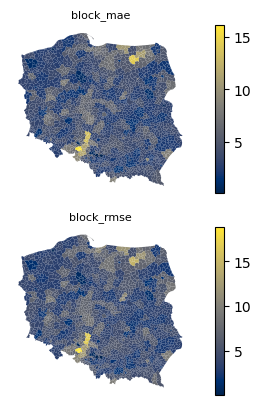

In [52]:
fig, axs = plt.subplots(2, 1)
for i, metric in enumerate(['block_mae', 'block_rmse']):
    gdf_gminas_soc_sejm_joined_spat_metrixs.plot(metric, ax=axs[i], legend=True, cmap="cividis")
    axs[i].set_title(metric, fontdict={"fontsize": 8})
    axs[i].set_axis_off()

### Conclusion
Based on the defined and described independent variables, various factors influencing the 2023 Parliamentary election results were compared. While the prepared model achieved very good results, it cannot be ruled out that different outcomes could be observed for other elections in Poland political system. Studying how selected parameters changed over time and affected voter preferences in various elections could be an interesting area for future research.